In [ ]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/Dog Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/Dog Vision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/MyDrive/Dog Visio

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
#!unzip "/content/drive/MyDrive/Colab Notebooks/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/"

In [ ]:
# prompt: unzip the file
#!unzip "/content/drive/MyDrive/Colab Notebooks/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/"


In [ ]:
#!unzip "drive/MyDrive/Dog Breed Classification/dog-breed-identification.zip" -d "drive/MyDrive/Dog Breed Classification/"

# End to End Multiclass dog breed classification

In [ ]:
# Importing Tensorflow in colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version : ", tf.__version__)
print("TF hub Version : ", hub.__version__)
print("GPU is available" if tf.config.list_physical_devices ('GPU') else "not available")

TF Version :  2.15.0
TF hub Version :  0.16.1
GPU is available


In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
labels_csv.head()
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


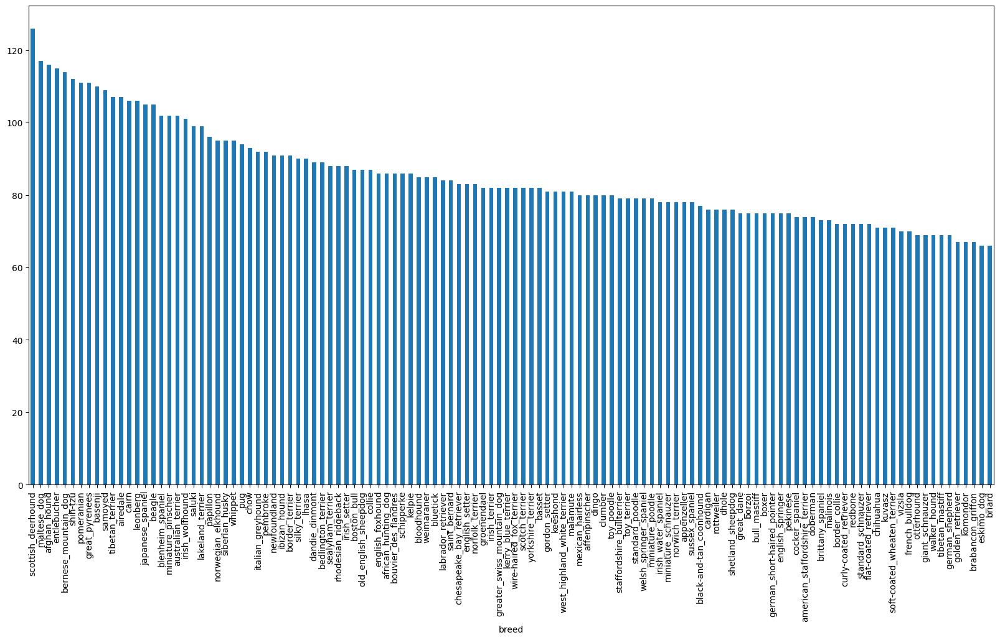

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10));

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv["breed"].value_counts().median()

82.0

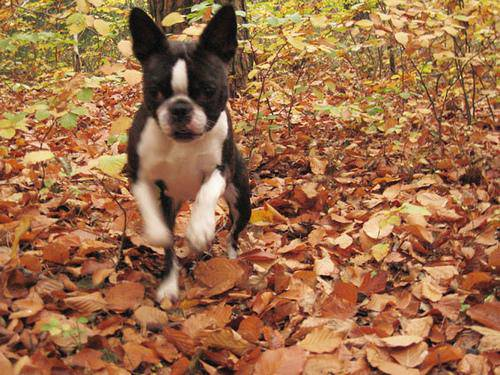

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

# Getting list of images and thier labels wit file pathnames

In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:5]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
import os
os.listdir("/content/drive/MyDrive/Dog Vision/train")[:10]

['dd3509cbfcfc094e5e4726b648a26048.jpg',
 'dc1c430fe26e231d4c8e13d2ee14c5ad.jpg',
 'e7af8f590b4fbdca0779f5e606ef91a1.jpg',
 'dd9aae7acb992593e07aa905ff4e5ca4.jpg',
 'dd52583a6a9bfdcc5278c5d61a57b7e1.jpg',
 'ddbc4983d977bc4e0f4e622da3dd747b.jpg',
 'e2ac9b607458c25b1422271887f27e35.jpg',
 'e9192e92049f545405dfbb8a2a05a8c7.jpg',
 'e734678e0c18e103c41023e11b92e012.jpg',
 'e47cac448a3250262bee5660d393da9a.jpg']

In [ ]:
# check whether number of filenames matches number of actual image files
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Number of files match")
else:
  print("Number of files doesn't match")

Number of files match


In [ ]:
print(len(filenames))
len(os.listdir("/content/drive/MyDrive/Dog Vision/train/"))

10222


10222

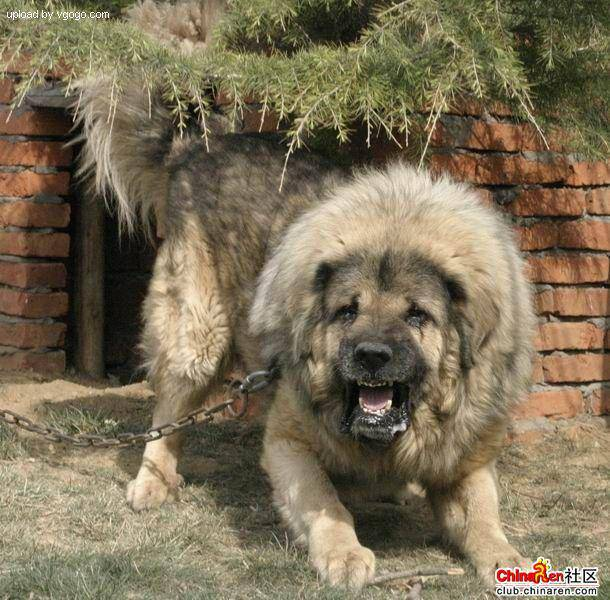

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels) == len(filenames)

True

In [ ]:
unique_breeds = np.unique(labels)
unique_breeds
len(unique_breeds)

120

In [ ]:
# Turn a single label into boolean
print(labels[0])
print(unique_breeds)
print(labels[0] == unique_breeds)

boston_bull
['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhoun

In [ ]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(len(boolean_labels))
print(len(labels))

10222
10222


In [ ]:
print(labels[1]) #original label
print(np.where(unique_breeds == labels[1])) # index where label occurs in unique_breeds
print(boolean_labels[1].argmax()) # argmax : returns the index of maximum number within te axis
print(boolean_labels[1].astype(int)) # return the 1st index of boolean_labels into integer form

dingo
(array([37]),)
37
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# setting up x and y
x = filenames
y = boolean_labels

We will start with experimenting with 1000 images and increase as needed

In [ ]:
# set number of imagaes to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min: 1000, max: 10000, step: 500}

In [ ]:
# let's split our data into train and validation set
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
x_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

# Preprossesing Images(Turning Images into tensors)

In [ ]:
# convert an image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2] # this is a array

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2] # this is a tensor
#both are same although we used tensorflow which is much more faster

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now as we seen how an image looks as a tensor, lets make a function to preprocess all image. The function shoul be able t
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable
3. Turn our `image` into tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`


In [ ]:
# Define Image size
IMG_SIZE = 224

# Create a function for preprocessing image
def process_image(image_path, img_size = IMG_SIZE):
  '''
  Takes an image filepath as input and process it
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image
  image = tf.image.resize(image,size = [IMG_SIZE,IMG_SIZE])

  return image

# Turning our data into batches'
why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they might not fit into memory. hence, we do 32(this is the batch size) images at a time.

In order to use tensorflow effectively we need ouyr data in form of tensor tuples whic looks like this :`(image, label)`

In [ ]:
# create a simple functrion to return tuple (image, label)
def get_image_label(image_path, label):

  '''
  Takes an image filepath and label and process it
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
# Now creating function for batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  '''
  Creates batches of data out of image (x) and label (y) pairs. Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  '''
  # Tf the data is a test data, we probably doht ave labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid set, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating trainning data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # shuffle pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(x))

    # Create (image, label) tuples
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch




In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data = True)

Creating trainning data batches...
Creating validation data batches...


### Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

# Creating a funcyion for visualize the 25 images in data
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from data batches
  '''
  # Set up the figure
  plt.figure(figsize = (10,10))
  # Loop through the 25 images
  for i in range(25):
    # Create subplot of 5 rows and 5 columns
    ax = plt.subplot(5, 5, i + 1)
    # Display Image
    plt.imshow(images[i])
    # Add a image label as a title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turning the axis off
    plt.axis("off")

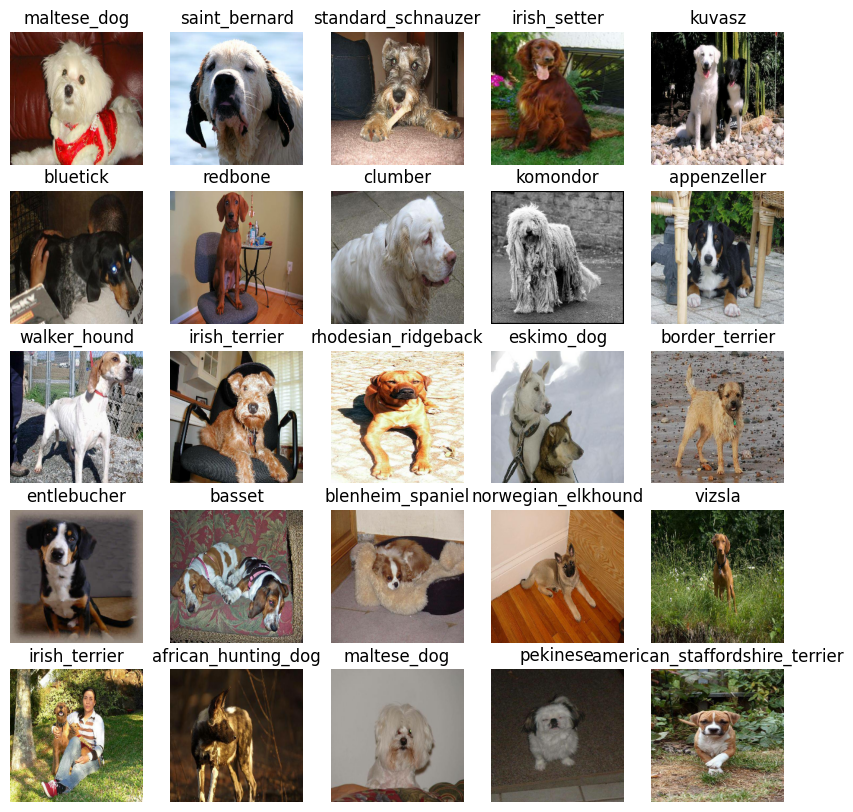

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

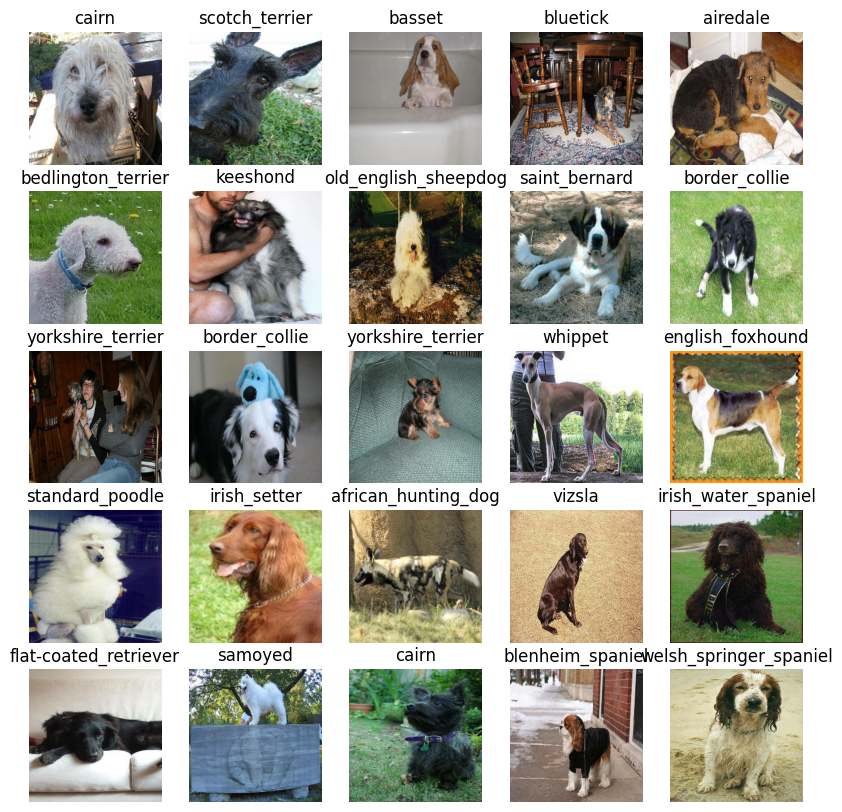

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
# building a model
import kagglehub
# Setup ainput shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channel

# Setup the output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model url from TensorFlow Hub
MODEL_URL = kagglehub.model_download("google/mobilenet-v2/tensorFlow2/130-224-classification")

100%|██████████| 19.4M/19.4M [00:01<00:00, 14.5MB/s]
Extracting model files...


In [ ]:
# Create a function which builds a Keras Model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building Model with: ", MODEL_URL)

  #setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE, activation = "softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building Model with:  /root/.cache/kagglehub/models/google/mobilenet-v2/tensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# Creating callback Functions
1. Tensorboard for tracking progress of our model
2. another one for earlu stopping for preventing overfitting

In [ ]:
# loading tensorboard notebook xtention
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Early stopping callback to generalize our model which can work with various datasets and avoid overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

In [ ]:
# Training a model(on subset of data)
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version
  '''
  # Create a model
  model = create_model()

  # create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building Model with:  /root/.cache/kagglehub/models/google/mobilenet-v2/tensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 242s 9s/step - loss: 4.3962 - accuracy: 0.1100 - val_loss: 3.4403 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 147ms/step - loss: 1.5362 - accuracy: 0.7088 - val_loss: 2.2287 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 4s 180ms/step - loss: 0.5418 - accuracy: 0.9275 - val_loss: 1.7436 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 5s 214ms/step - loss: 0.2473 - accuracy: 0.9787 - val_loss: 1.5675 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1445 - accuracy: 0.9962 - val_loss: 1.4834 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 5s 218ms/step - loss: 0.0981 - accuracy: 1.0000 - val_loss: 1.4359 - val_accuracy: 0.6500
Epoch 7/100
25/25 [===============

In [ ]:
# Checking the tensorboard log
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

# Making and evaluating predictions using trained model


In [ ]:
# make predictions on the validation data
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 117ms/step


array([[2.15050601e-03, 2.36595697e-05, 3.31440126e-04, ...,
        4.01404570e-04, 3.09514726e-05, 2.29318510e-03],
       [8.45626276e-03, 1.99137561e-04, 9.06999130e-03, ...,
        4.94409833e-05, 6.56901859e-03, 4.12454625e-04],
       [9.87284238e-06, 3.55726661e-05, 2.05331045e-04, ...,
        2.23303559e-05, 2.90804783e-05, 1.63087258e-04],
       ...,
       [6.56555358e-06, 3.92926922e-05, 1.09817623e-03, ...,
        1.42347108e-05, 3.16681748e-04, 1.04216946e-04],
       [1.14153121e-02, 6.33400632e-05, 1.47330458e-04, ...,
        1.46886145e-04, 4.33686000e-05, 7.24285003e-03],
       [1.57526709e-04, 1.25396809e-05, 2.45035655e-04, ...,
        5.09028416e-03, 2.25421201e-04, 4.35488691e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(predictions[0])

120

In [ ]:
index = 0
print(predictions[index])
print(f"Max Value (probability of predicton): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.15050601e-03 2.36595697e-05 3.31440126e-04 3.56523597e-05
 7.98998517e-04 1.28759430e-05 1.10045224e-02 5.34408086e-04
 1.60483047e-04 1.04291760e-03 3.60616628e-04 4.01184283e-04
 3.88344750e-04 3.34097451e-04 1.51922082e-04 2.80225824e-04
 1.18342046e-04 2.33155012e-01 1.15233552e-05 1.92221305e-05
 5.37695189e-04 1.00384103e-04 1.93328415e-05 7.34869041e-04
 1.10343208e-05 2.15492400e-04 2.35053599e-01 5.76050224e-05
 1.66832528e-04 2.34142455e-04 5.42843954e-05 8.54536949e-04
 1.24728918e-04 9.24922369e-06 2.07190285e-04 2.15738397e-02
 5.34334213e-05 4.31387773e-04 1.92431311e-04 3.11740208e-04
 1.60484819e-03 7.47635477e-06 4.52504406e-04 8.49199787e-05
 1.30059037e-04 2.15882901e-05 3.93108676e-05 8.33028986e-04
 4.13944537e-04 7.39295720e-05 1.06202941e-04 1.01703918e-04
 1.75705078e-04 1.40816177e-04 6.15907367e-04 9.31294780e-05
 1.68026163e-04 1.37210637e-03 6.35289005e-04 1.13583878e-01
 7.58460897e-04 2.59790086e-05 2.78082467e-03 6.69522615e-06
 1.26401172e-03 1.742114

In [ ]:
# Turn Predictions probabilities into their respective label
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of predictions probabilities into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]
# testing
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

In [ ]:
# Creating a function to unbatch the batch dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image, label) pairs and returns separate arrays for images and labels
  '''
  images = []
  labels = []
  # Loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
# visualize the predictions and correction labels
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  view the prediction, ground truth label and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot the image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change colour of title based on prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label), color = color)

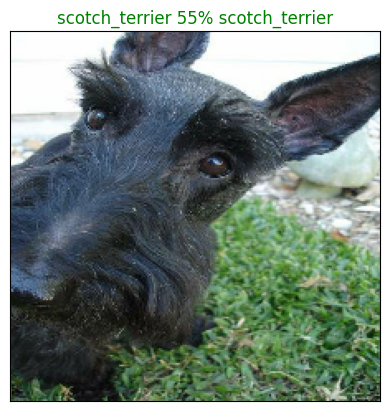

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n = 1)

In [ ]:
# plot top 10 prediction probability values and labels, coloring the true label green
def plot_pred_conf(prediction_probabilities, labels,n = 1):
  '''
  plus the top 10 highest prediction confidence along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted Label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidene indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Plot the top 10 prediction confidence
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup Plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

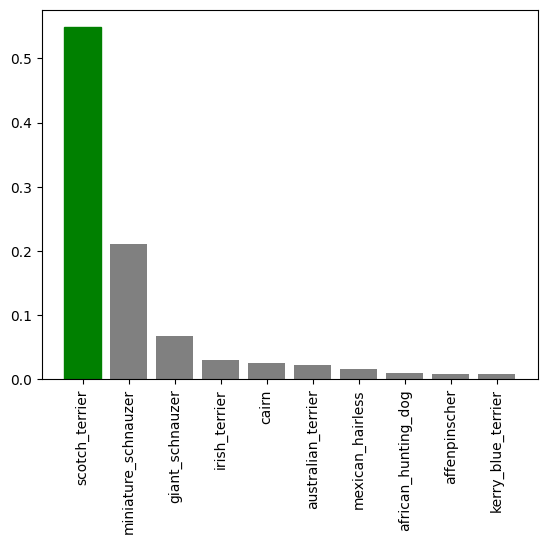

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
          labels = val_labels,
          n = 1)

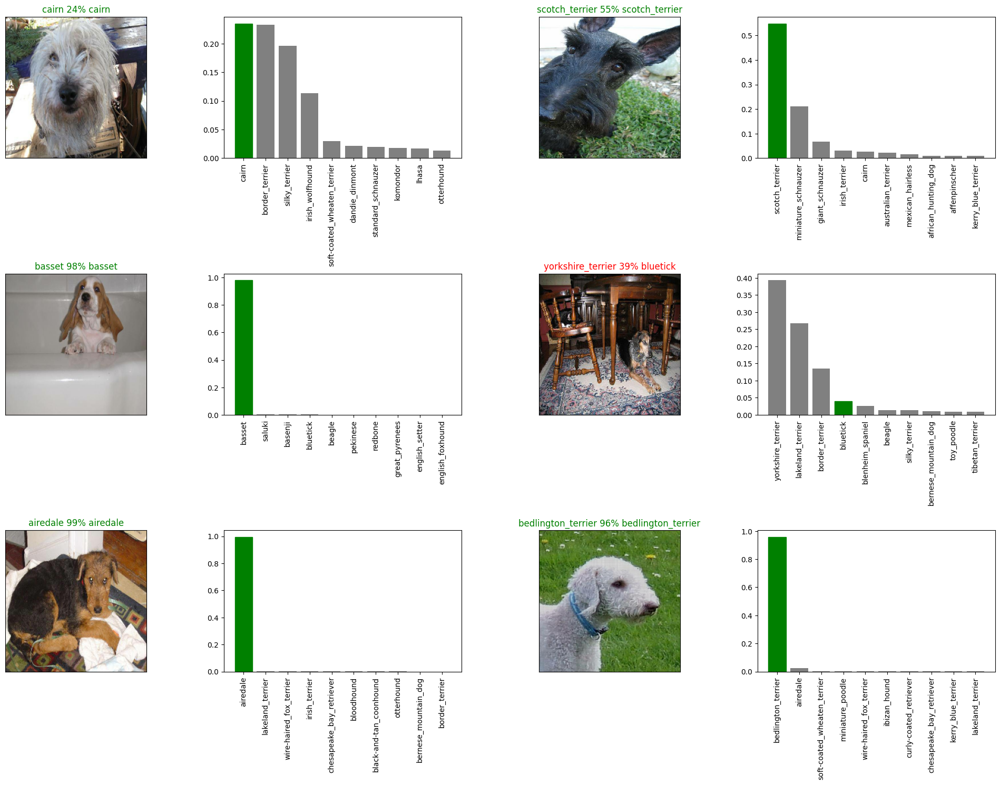

In [ ]:
# checking out few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i + i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

In [ ]:
# Create a function to Saving and reloading a trained model
def save_model(model, suffix = None):
  '''
  Saves a given model in a models directoey and appends a suffix (string)
  '''
  # Create a model directory with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" #h5 is extension of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Craete a function to load a model
def load_model(model_path):
  '''
  Loads a saved model from a specified path
  '''
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# Save our model on 1000 images
save_model(model, suffix = "1000_images")

Saving model to: drive/MyDrive/Dog Vision/models/20240715-051836-1000_images.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240715-051836-1000_images.h5'

In [ ]:
# load a trained model
load_1000_images_model = load_model("drive/MyDrive/Dog Vision/models/20240715-051836-1000_images.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20240715-051836-1000_images.h5


In [ ]:
# Evaluate the pre-Saved model
load_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 99ms/step - loss: 1.3002 - accuracy: 0.6950


[1.3001751899719238, 0.6949999928474426]

# Training a model on whole data


In [ ]:
#Creating data batch
full_data = create_data_batches(x,y)

Creating trainning data batches...


In [ ]:
# create a model for full model
full_model = create_model()

Building Model with:  /root/.cache/kagglehub/models/google/mobilenet-v2/tensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# There is no validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

In [ ]:
# Fit the full model to full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 49s 141ms/step - loss: 1.3373 - accuracy: 0.6704
Epoch 2/100
320/320 [==============================] - 42s 132ms/step - loss: 0.4016 - accuracy: 0.8828
Epoch 3/100
320/320 [==============================] - 45s 142ms/step - loss: 0.2384 - accuracy: 0.9333
Epoch 4/100
320/320 [==============================] - 44s 138ms/step - loss: 0.1526 - accuracy: 0.9632
Epoch 5/100
320/320 [==============================] - 45s 140ms/step - loss: 0.1037 - accuracy: 0.9798
Epoch 6/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0771 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0587 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 47s 145ms/step - loss: 0.0451 - accuracy: 0.9952
Epoch 9/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0378 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 42s 132m

In [ ]:
save_model(full_model, suffix = "full-image-set-model")

Saving model to: drive/MyDrive/Dog Vision/models/20240715-054020-full-image-set-model.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240715-054020-full-image-set-model.h5'

In [ ]:
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20240715-054020-full-image-set-model.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20240715-054020-full-image-set-model.h5


In [ ]:
# load test image filename
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e9b16b4bdf5b0561fc7c69b2f36e1a7e.jpg',
 'drive/MyDrive/Dog Vision/test/e83fec66a32873298df9fa5fdac113aa.jpg',
 'drive/MyDrive/Dog Vision/test/f4af276965865188983afcbb5fca9cc2.jpg',
 'drive/MyDrive/Dog Vision/test/f13011a399f175d88c17d2bd1785625e.jpg',
 'drive/MyDrive/Dog Vision/test/ede33cc93aa6dd4f7bc7fb2436026d08.jpg',
 'drive/MyDrive/Dog Vision/test/f4cd3448e7e39070c86f551bfd4f1471.jpg',
 'drive/MyDrive/Dog Vision/test/f27521a58ff23d0bb6390bd802b368c4.jpg',
 'drive/MyDrive/Dog Vision/test/e9cee3bd9000422ec5e391c932da60f8.jpg',
 'drive/MyDrive/Dog Vision/test/f361999cc41b3d83214d8104c91c672d.jpg',
 'drive/MyDrive/Dog Vision/test/eac3503b463e275d9f3053b8fcd5a58a.jpg']

In [ ]:
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 516s 2s/step


In [ ]:
# Save predictions (Numpy array) to csv file
np.savetxt("drive/MyDrive/Dog Vision/test_predictions.csv", test_predictions, delimiter = ",")

In [ ]:
# Load predictions
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/test_predictions.csv", delimiter = ",")

In [ ]:
# Create a pandas dataframe with empty columns
preds_df =pd.DataFrame(columns = ["id"] +list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image id to pred_df
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e9b16b4bdf5b0561fc7c69b2f36e1a7e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e83fec66a32873298df9fa5fdac113aa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f4af276965865188983afcbb5fca9cc2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f13011a399f175d88c17d2bd1785625e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ede33cc93aa6dd4f7bc7fb2436026d08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,07e56f8e36196be69405e4c524c99b98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,077688a43b63922f7879b2fd66d32509,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,08680f416f6cf8ab00fcdf51c217b5f7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,08f5846ac17ac1b421305a4cc82c6824,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e9b16b4bdf5b0561fc7c69b2f36e1a7e,7.161805e-11,3.003218e-11,3.212847e-10,1.549450e-09,7.904729e-08,3.378584e-05,9.070189e-07,6.792700e-07,2.250705e-08,...,2.396080e-10,1.746093e-08,2.300469e-08,1.081608e-05,3.441485e-08,1.085847e-07,1.091479e-09,1.805436e-10,6.973518e-08,1.165602e-10
1,e83fec66a32873298df9fa5fdac113aa,2.354905e-08,3.827189e-08,3.758205e-09,3.088000e-11,1.073043e-10,7.911253e-09,7.409719e-11,5.685402e-11,4.721291e-11,...,1.818191e-10,7.547570e-10,3.979908e-10,2.083331e-09,6.275280e-08,1.324714e-12,4.313307e-10,1.004127e-07,5.004978e-07,2.691083e-09
2,f4af276965865188983afcbb5fca9cc2,3.371436e-14,2.145454e-13,1.666286e-08,3.027025e-12,1.191666e-09,1.691821e-07,4.032382e-06,9.295032e-10,2.351258e-11,...,1.800456e-11,3.457611e-08,4.564066e-11,3.745189e-10,1.215316e-11,4.358585e-08,1.737212e-10,1.117102e-11,2.949246e-11,9.736205e-14
3,f13011a399f175d88c17d2bd1785625e,2.830248e-11,2.206050e-11,3.011862e-12,9.434942e-11,9.718810e-09,5.982687e-13,5.579946e-13,6.797289e-15,8.704709e-13,...,3.021497e-14,1.891216e-14,3.707828e-12,9.223913e-14,2.826148e-11,7.560658e-14,3.327627e-16,1.135038e-11,4.177866e-12,9.627564e-15
4,ede33cc93aa6dd4f7bc7fb2436026d08,9.850072e-12,4.296424e-10,1.746312e-12,2.312812e-08,2.366484e-09,1.678855e-05,3.563303e-09,2.296745e-12,8.993864e-11,...,8.467308e-12,8.559792e-10,9.511021e-10,5.414620e-06,3.928917e-08,4.522903e-09,1.261507e-12,1.437922e-08,7.171525e-13,2.571552e-10


In [ ]:
preds_df.to_csv( "drive/MyDrive/Dog Vision/full-model-predictions.csv", index = False)

# Making predictions on custom images


In [ ]:
# Get custom image filenames
custom_path = "drive/MyDrive/Dog Vision/custom/"
custom_filenames = [custom_path + fname for fname in os.listdir(custom_path)]
custom_filenames

In [ ]:
# Turn custom images in batch images
custom_data = create_data_batches(custom_filnames, test_data = True)

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data, verbose = 1)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range len(custom_preds)]
custom_pred_labels

In [ ]:
# Get custom image
custom_images = []
# loop through unbatched data
for image, label in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image prediction
plt.figure(figsize = (10,10))
for i, image in enumerate(custom_images):
  ax = plt.subplot(1, 3, i + 1)
  plt.xticks()
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)